In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/animefacedataset/images/35715_2011.jpg
/kaggle/input/animefacedataset/images/48610_2014.jpg
/kaggle/input/animefacedataset/images/34719_2011.jpg
/kaggle/input/animefacedataset/images/40266_2012.jpg
/kaggle/input/animefacedataset/images/4199_2002.jpg
/kaggle/input/animefacedataset/images/40739_2013.jpg
/kaggle/input/animefacedataset/images/42515_2013.jpg
/kaggle/input/animefacedataset/images/52482_2015.jpg
/kaggle/input/animefacedataset/images/46555_2014.jpg
/kaggle/input/animefacedataset/images/11579_2005.jpg
/kaggle/input/animefacedataset/images/36943_2012.jpg
/kaggle/input/animefacedataset/images/9787_2004.jpg
/kaggle/input/animefacedataset/images/3388_2002.jpg
/kaggle/input/animefacedataset/images/8393_2004.jpg
/kaggle/input/animefacedataset/images/30352_2010.jpg
/kaggle/input/animefacedataset/images/10908_2005.jpg
/kaggle/input/animefacedataset/images/22363_2008.jpg
/kaggle/input/animefacedataset/images/51151_2015.jpg
/kaggle/input/animefacedataset/images/59491_2018.j

In [1]:
import os
import random
import torch
import torchvision
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchvision.utils import make_grid
from torch.utils.data import Dataset
from PIL import Image
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from IPython.display import Image
device=torch.device('cuda')
data_dir='/kaggle/input/animefacedataset'
image_size=64
batch_size=128
#standard Normalisation found online
stats=(0.5,0.5,0.5),(0.5,0.5,0.5)


In [ ]:
train_ds = ImageFolder(data_dir, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),#cab be rectangles
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)# use multiple 
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]# we are denormalizing 

def show_images(images, nmax=64):
    images = images[:nmax].detach().cpu()  # Move images to CPU and detach them from the computation graph
    grid = make_grid(images, nrow=8).permute(1, 2, 0)  # Arrange images in a grid and permute dimensions
    plt.figure(figsize=(8, 8))
    plt.axis('off')  # Remove axis
    plt.imshow(grid)  # Display the grid of images
    plt.show()# here i used permute because mathplt lib requires colour dimentions in last stage

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break


In [3]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.cn1 = nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.a1 = nn.LeakyReLU(0.2, inplace=True)

        self.cn2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(128)
        self.a2 = nn.LeakyReLU(0.2, inplace=True)

        self.cn3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(256)
        self.a3 = nn.LeakyReLU(0.2, inplace=True)

        self.cn4 = nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn4 = nn.BatchNorm2d(512)
        self.a4 = nn.LeakyReLU(0.2, inplace=True)

        self.cn5 = nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False)
        
        self.flatten = nn.Flatten()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        #
        x = self.a1(self.bn1(self.cn1(x)))
        x = self.a2(self.bn2(self.cn2(x)))
        x = self.a3(self.bn3(self.cn3(x)))
        x = self.a4(self.bn4(self.cn4(x)))
        x = self.cn5(x)
        x = self.flatten(x)
        x = self.sigmoid(x)
        
       
        return x



In [4]:
import torch
import torch.nn as nn

latent_size = 128  #128 noise pixels of size: 1x1 kept discretely

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

       

        # Input size: latent_size x 1 x 1 -> Output: 512 x 4 x 4
        self.cn1 = nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(512)
        self.a1 = nn.ReLU(True)

        # Input size: 512 x 4 x 4 -> Output: 256 x 8 x 8
        self.cn2 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(256)
        self.a2 = nn.ReLU(True)

        # Input size: 256 x 8 x 8 -> Output: 128 x 16 x 16
        self.cn3 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(128)
        self.a3 = nn.ReLU(True)

        # Input size: 128 x 16 x 16 -> Output: 64 x 32 x 32
        self.cn4 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False)
        self.bn4 = nn.BatchNorm2d(64)
        self.a4 = nn.ReLU(True)

        # Input size: 64 x 32 x 32 -> Output: 3 x 64 x 64 (final RGB image)
        self.cn5 = nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False)
        self.tanh = nn.Tanh()  # Output pixel values in range [-1, 1]

    def forward(self, x):
        # Apply the layers in sequence manually
        x = self.a1(self.bn1(self.cn1(x)))
        x = self.a2(self.bn2(self.cn2(x)))
        x = self.a3(self.bn3(self.cn3(x)))
        x = self.a4(self.bn4(self.cn4(x)))
        x = self.cn5(x)
        x = self.tanh(x)
        
        return x

torch.Size([128, 3, 64, 64])


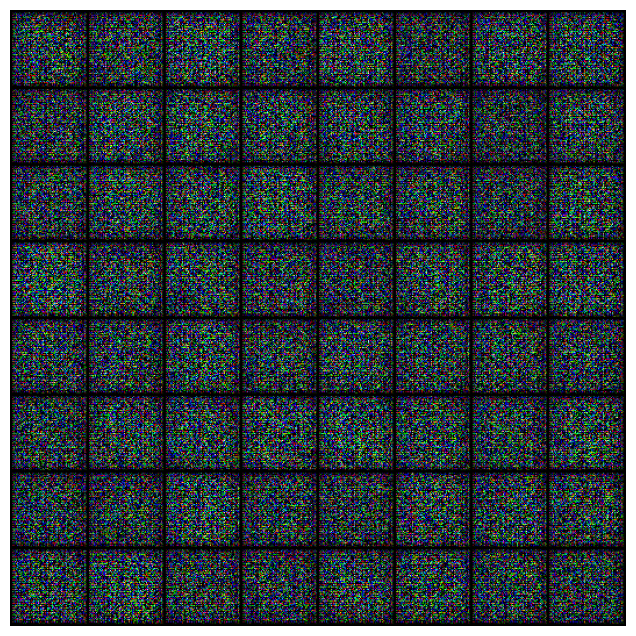

In [5]:
gen=Generator().to(device)
dis=Discriminator().to(device)
noise=torch.randn(batch_size,latent_size,1,1).to(device)
fake_image=gen(noise)
print(fake_image.shape)
show_images(fake_image)

In [6]:
import torch.nn.functional as F
def train_discriminator(real_images, opt_d):
      opt_d.zero_grad()
      real_images = real_images.to(device)
   

    # Pass real images through discriminator
      real_preds = dis(real_images)
      real_targets = torch.ones(real_images.size(0), 1, device=device)


      real_loss = F.binary_cross_entropy(real_preds, real_targets)
      real_score = torch.mean(real_preds).item()

    # Generate fake images and pass through discriminator
      latent = torch.randn(real_images.size(0), latent_size, 1, 1, device=device)
      fake_images = gen(latent)
      fake_preds = dis(fake_images.detach())
      fake_targets = torch.zeros(fake_images.size(0), 1, device=device)

      fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
      fake_score = torch.mean(fake_preds).item()

      loss = real_loss + fake_loss
      loss.backward()
      opt_d.step()
    
      return loss.item(), real_score, fake_score

In [7]:
def train_generator(opt_g):
    opt_g.zero_grad()
    #generate fakes and pass through dicriminator by settiing the target variable in the generator point of view that is it's target is to achieve (1)right to fool the discriminator
    latent=torch.randn(batch_size,latent_size,1,1,device=device)
    images=gen(latent)
    preds=dis(images)
    targets=torch.ones(images.size(0),1,device=device)
    loss=F.binary_cross_entropy(preds,targets)
    
    loss.backward()
    opt_g.step()
   
    return loss.item()
    

In [8]:
from torchvision.utils import save_image
sample_dir = 'generated_final'
os.makedirs(sample_dir, exist_ok=True)

In [9]:
def save_samples(index, latent_tensors, show=True):
    fake_images = gen(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [10]:
fixed_latent=torch.randn(64,latent_size,1,1,device=device)


Saving generated-images-0000.png


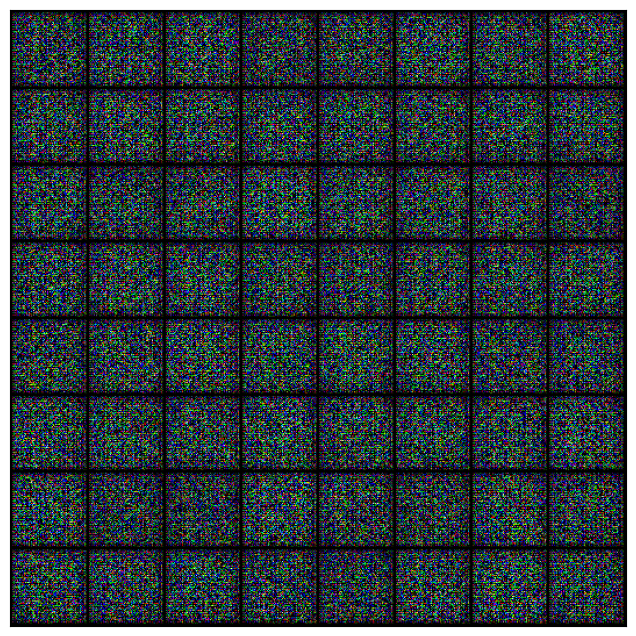

In [11]:
save_samples(0,fixed_latent)

In [12]:
from tqdm.notebook import tqdm

def fit(epochs, lr, start_idx=1):
    
    torch.cuda.empty_cache()
    losses_d = []
    #empty dictionaries
    losses_g = []
    real_scores = []
    fake_scores = []
    opt_d = torch.optim.Adam(dis.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(gen.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoches in range(epochs): 
        for real_images, _ in tqdm(train_dl):
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)

        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
    
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoches + 1, epochs, loss_g, loss_d, real_score, fake_score))
        
        save_samples(epoches + start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores


In [13]:
lr = 0.0002
epochs = 50


In [14]:
results=fit(epochs,lr)


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/50], loss_g: 3.6739, loss_d: 0.5388, real_score: 0.7318, fake_score: 0.1432
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/50], loss_g: 7.8590, loss_d: 0.6170, real_score: 0.8821, fake_score: 0.3526
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/50], loss_g: 6.3051, loss_d: 0.3442, real_score: 0.9807, fake_score: 0.2506
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/50], loss_g: 4.5886, loss_d: 0.2917, real_score: 0.7940, fake_score: 0.0089
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/50], loss_g: 6.1182, loss_d: 0.1666, real_score: 0.9257, fake_score: 0.0705
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/50], loss_g: 9.3244, loss_d: 0.2908, real_score: 0.9696, fake_score: 0.2161
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/50], loss_g: 6.3084, loss_d: 0.0736, real_score: 0.9928, fake_score: 0.0579
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/50], loss_g: 7.9022, loss_d: 0.2864, real_score: 0.8376, fake_score: 0.0014
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/50], loss_g: 7.2881, loss_d: 0.2281, real_score: 0.8310, fake_score: 0.0007
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/50], loss_g: 5.6423, loss_d: 0.0777, real_score: 0.9483, fake_score: 0.0071
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/50], loss_g: 6.9500, loss_d: 0.0439, real_score: 0.9763, fake_score: 0.0163
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/50], loss_g: 5.3607, loss_d: 0.1657, real_score: 0.9211, fake_score: 0.0565
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/50], loss_g: 7.8545, loss_d: 0.0756, real_score: 0.9526, fake_score: 0.0086
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/50], loss_g: 11.0441, loss_d: 0.1576, real_score: 0.9899, fake_score: 0.1262
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/50], loss_g: 10.8172, loss_d: 0.1567, real_score: 0.9761, fake_score: 0.1047
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/50], loss_g: 13.4014, loss_d: 0.0155, real_score: 0.9924, fake_score: 0.0075
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/50], loss_g: 5.5772, loss_d: 0.0899, real_score: 0.9367, fake_score: 0.0045
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/50], loss_g: 20.3699, loss_d: 0.5225, real_score: 0.9992, fake_score: 0.3129
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/50], loss_g: 12.1588, loss_d: 0.0220, real_score: 0.9809, fake_score: 0.0003
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/50], loss_g: 8.9623, loss_d: 0.1103, real_score: 0.9580, fake_score: 0.0445
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/50], loss_g: 8.7797, loss_d: 0.0554, real_score: 0.9903, fake_score: 0.0432
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/50], loss_g: 7.0792, loss_d: 0.0199, real_score: 0.9986, fake_score: 0.0183
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/50], loss_g: 12.7389, loss_d: 0.1838, real_score: 0.9920, fake_score: 0.1551
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/50], loss_g: 9.5001, loss_d: 0.0986, real_score: 0.9300, fake_score: 0.0006
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/50], loss_g: 4.9427, loss_d: 0.0992, real_score: 0.9463, fake_score: 0.0261
Saving generated-images-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/50], loss_g: 14.1601, loss_d: 0.2002, real_score: 0.9913, fake_score: 0.1623
Saving generated-images-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/50], loss_g: 6.6055, loss_d: 0.0621, real_score: 0.9973, fake_score: 0.0529
Saving generated-images-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/50], loss_g: 7.4984, loss_d: 0.0548, real_score: 0.9946, fake_score: 0.0454
Saving generated-images-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/50], loss_g: 19.3329, loss_d: 0.5295, real_score: 1.0000, fake_score: 0.2991
Saving generated-images-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/50], loss_g: 6.6620, loss_d: 0.0127, real_score: 0.9930, fake_score: 0.0055
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/50], loss_g: 7.4479, loss_d: 0.0491, real_score: 0.9761, fake_score: 0.0226
Saving generated-images-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/50], loss_g: 6.0029, loss_d: 0.1521, real_score: 0.9225, fake_score: 0.0231
Saving generated-images-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/50], loss_g: 8.2306, loss_d: 0.1313, real_score: 0.9054, fake_score: 0.0002
Saving generated-images-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/50], loss_g: 6.6110, loss_d: 0.0232, real_score: 0.9862, fake_score: 0.0069
Saving generated-images-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/50], loss_g: 12.0428, loss_d: 0.1266, real_score: 0.9989, fake_score: 0.1145
Saving generated-images-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/50], loss_g: 2.9723, loss_d: 0.2538, real_score: 0.8598, fake_score: 0.0174
Saving generated-images-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/50], loss_g: 8.4053, loss_d: 0.0199, real_score: 0.9835, fake_score: 0.0012
Saving generated-images-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/50], loss_g: 18.7471, loss_d: 0.4188, real_score: 0.9970, fake_score: 0.2461
Saving generated-images-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/50], loss_g: 16.0258, loss_d: 0.0233, real_score: 0.9867, fake_score: 0.0048
Saving generated-images-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/50], loss_g: 7.5243, loss_d: 0.0287, real_score: 0.9805, fake_score: 0.0062
Saving generated-images-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/50], loss_g: 7.4401, loss_d: 0.0545, real_score: 0.9990, fake_score: 0.0487
Saving generated-images-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/50], loss_g: 6.3856, loss_d: 0.0750, real_score: 0.9541, fake_score: 0.0039
Saving generated-images-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/50], loss_g: 4.6965, loss_d: 0.2227, real_score: 0.8992, fake_score: 0.0339
Saving generated-images-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/50], loss_g: 5.0646, loss_d: 0.0769, real_score: 0.9610, fake_score: 0.0096
Saving generated-images-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/50], loss_g: 24.1038, loss_d: 0.0649, real_score: 0.9763, fake_score: 0.0001
Saving generated-images-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/50], loss_g: 6.9682, loss_d: 0.0049, real_score: 0.9985, fake_score: 0.0033
Saving generated-images-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/50], loss_g: 8.4432, loss_d: 0.0338, real_score: 0.9718, fake_score: 0.0005
Saving generated-images-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/50], loss_g: 7.1341, loss_d: 0.0737, real_score: 0.9733, fake_score: 0.0204
Saving generated-images-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/50], loss_g: 29.0652, loss_d: 0.0226, real_score: 0.9879, fake_score: 0.0051
Saving generated-images-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/50], loss_g: 4.2606, loss_d: 0.0833, real_score: 0.9512, fake_score: 0.0097
Saving generated-images-0050.png


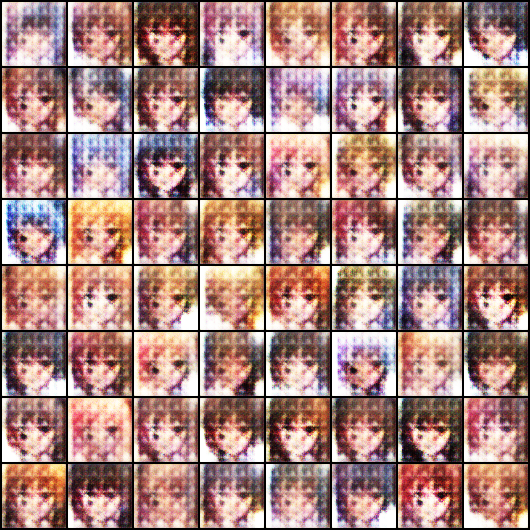

In [15]:
Image('./generated_final/generated-images-0001.png')

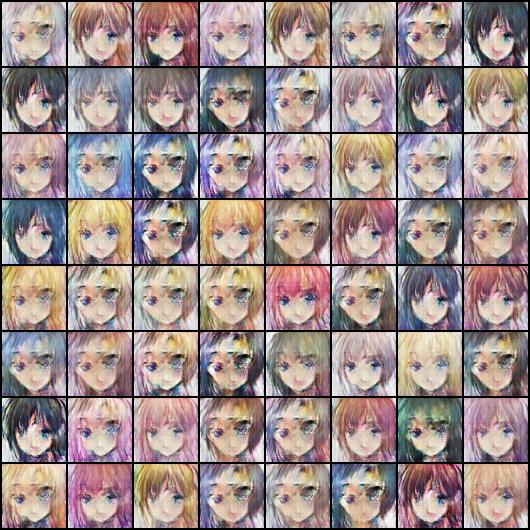

In [16]:
Image('./generated_final/generated-images-0010.png')

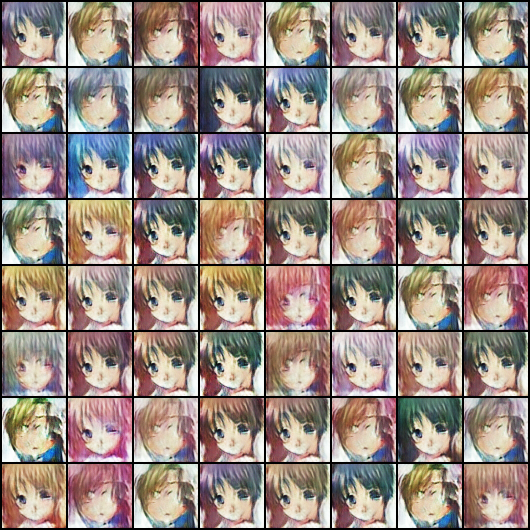

In [17]:
Image('./generated_final/generated-images-0030.png')

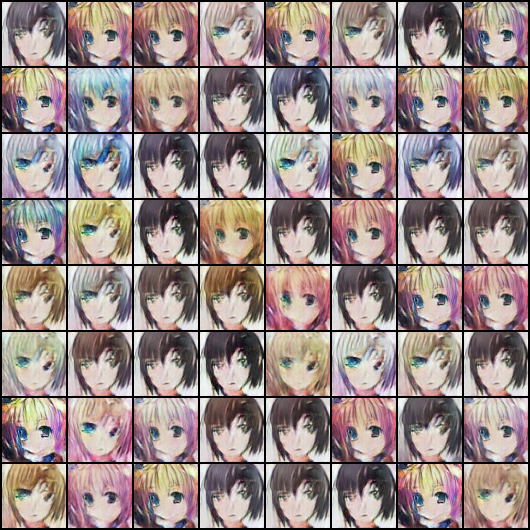

In [18]:
Image('./generated_final/generated-images-0040.png')

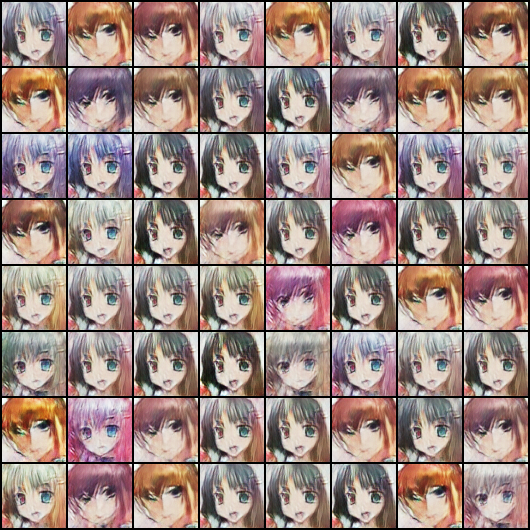

In [19]:
Image('./generated_final/generated-images-0050.png')